<a href="https://colab.research.google.com/github/harshitneverdebugs/TrackZone/blob/main/YOLOv8n.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install ultralytics #Installing the Ultralytics YOLO library

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 17.3 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO #importing YOLO from Ultralytics
import cv2#importing OpenCV library

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Using the Roboflow API to access the dataset to tran the YOLOv8n model

In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="gdXIKP3144x9M45COAkh")
project = rf.workspace("dave-r7nyf").project("test_detection_person")
version = project.version(1)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.2 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Test_Detection_Person-1 in yolov8:: 100%|██████████| 2836/2836 [00:00<00:00, 4753.36it/s]


In [5]:
print("Dataset location:", dataset.location)#displays the location of the datset
#Checking the contents of the downloaded dataset
import os

#Useing os.listdir() to list all the files in the main dataset directory provided by Roboflow API.
dataset_path = dataset.location  # The path Roboflow gives
files_in_dataset = os.listdir(dataset_path)
print("Files in dataset:", files_in_dataset)

#Constructing the path for train, test and valid set
train_dir = os.path.join(dataset_path, 'train')
valid_dir = os.path.join(dataset_path, 'valid')
test_dir = os.path.join(dataset_path, 'test')

#Listing the paths of the the files
print("Train folder contents:", os.listdir(train_dir))
print("Valid folder contents:", os.listdir(valid_dir))
print("Test folder contents:", os.listdir(test_dir))

Dataset location: /content/Test_Detection_Person-1
Files in dataset: ['README.roboflow.txt', 'test', 'data.yaml', 'valid', 'README.dataset.txt', 'train']
Train folder contents: ['labels', 'images']
Valid folder contents: ['labels', 'images']
Test folder contents: ['labels', 'images']


* The data.yaml file generated by Roboflow is a configuration file required for YOLO training

In [6]:
#Importing the YOLO package from the ultralytics library to use YOLOv8
from ultralytics import YOLO

#Initializing the YOLOv8 model using a pre-trained weight file (yolov8n.pt)
model = YOLO('yolov8n.pt') #model being used is YOLOv8n (n stands for nano)

#Training the YOLOv8 model with a custom dataset
# Training will run for 50 epochs with an image size of 640x640
model.train(data='/content/Test_Detection_Person-1/data.yaml', epochs=50, imgsz=640)

100%|██████████| 6.25M/6.25M [00:00<00:00, 354MB/s]


Ultralytics 8.3.44 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Test_Detection_Person-1/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=

100%|██████████| 755k/755k [00:00<00:00, 61.8MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 353MB/s]


AMP: checks passed ✅


train: Scanning /content/Test_Detection_Person-1/train/labels... 991 images, 49 backgrounds, 0 corrupt: 100%|██████████| 991/991 [00:00<00:00, 1702.44it/s]

train: WARNING ⚠️ /content/Test_Detection_Person-1/train/images/GX010023_frame_00025_right_jpg.rf.9f80f7aea07bd5cadc40f9faa9c81228.jpg: 23 duplicate labels removed
train: New cache created: /content/Test_Detection_Person-1/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 48, len(boxes) = 7272. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.22 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/Test_Detection_Person-1/valid/labels... 280 images, 6 backgrounds, 0 corrupt: 100%|██████████| 280/280 [00:00<00:00, 981.60it/s]


val: New cache created: /content/Test_Detection_Person-1/valid/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.86G      1.736      1.981      1.471        268        640: 100%|██████████| 62/62 [00:23<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.46it/s]

                   all        280       2207      0.497      0.153      0.161     0.0779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.94G      1.834      1.785      1.524        115        640: 100%|██████████| 62/62 [00:23<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.08it/s]

                   all        280       2207      0.154      0.198     0.0779     0.0275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       4.4G      1.938      1.799      1.613        135        640: 100%|██████████| 62/62 [00:21<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.45it/s]

                   all        280       2207      0.232      0.185      0.108     0.0432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.24G      1.956      1.799       1.63         72        640: 100%|██████████| 62/62 [00:22<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.84it/s]

                   all        280       2207      0.462      0.386      0.352      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.59G      1.923      1.726        1.6        486        640: 100%|██████████| 62/62 [00:23<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.02it/s]

                   all        280       2207      0.463      0.376      0.344      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.23G      1.929      1.659      1.547        107        640: 100%|██████████| 62/62 [00:22<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.17it/s]


                   all        280       2207      0.503      0.403      0.391      0.156

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.54G      1.831      1.588      1.566         97        640: 100%|██████████| 62/62 [00:21<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.16it/s]

                   all        280       2207      0.518      0.414      0.394      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.01G      1.847      1.576      1.538        115        640: 100%|██████████| 62/62 [00:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.44it/s]

                   all        280       2207      0.534      0.449      0.414      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.57G      1.833      1.594      1.536        138        640: 100%|██████████| 62/62 [00:25<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.12it/s]

                   all        280       2207      0.568      0.444      0.446      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.57G      1.786       1.47        1.5         88        640: 100%|██████████| 62/62 [00:22<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.32it/s]

                   all        280       2207      0.517      0.372      0.359      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.92G      1.758      1.465      1.472        155        640: 100%|██████████| 62/62 [00:21<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.27it/s]

                   all        280       2207      0.505      0.421       0.38      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.82G      1.751      1.458      1.455        155        640: 100%|██████████| 62/62 [00:25<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]

                   all        280       2207      0.576      0.485      0.491      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.69G      1.747       1.45      1.469        154        640: 100%|██████████| 62/62 [00:21<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.22it/s]


                   all        280       2207      0.597      0.505      0.495      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.75G      1.716      1.414       1.46        129        640: 100%|██████████| 62/62 [00:21<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.99it/s]

                   all        280       2207      0.643      0.461      0.503      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.66G      1.697      1.382      1.458        321        640: 100%|██████████| 62/62 [00:23<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.16it/s]

                   all        280       2207      0.539      0.504      0.488      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.16G      1.723      1.406      1.446        116        640: 100%|██████████| 62/62 [00:21<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.23it/s]


                   all        280       2207      0.623       0.47      0.504      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.89G      1.658      1.354      1.426        278        640: 100%|██████████| 62/62 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.35it/s]

                   all        280       2207      0.646      0.509      0.538      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.41G      1.628      1.301      1.399        162        640: 100%|██████████| 62/62 [00:22<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.43it/s]

                   all        280       2207       0.62      0.526       0.54      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.96G      1.651      1.338      1.406        192        640: 100%|██████████| 62/62 [00:21<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.74it/s]

                   all        280       2207      0.603      0.505      0.507      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.77G      1.622      1.321        1.4        183        640: 100%|██████████| 62/62 [00:23<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.97it/s]

                   all        280       2207      0.647      0.516      0.541      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.16G      1.654      1.326      1.403         83        640: 100%|██████████| 62/62 [00:20<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.33it/s]

                   all        280       2207       0.65       0.46      0.494      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.88G      1.595       1.28        1.4        101        640: 100%|██████████| 62/62 [00:20<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.79it/s]

                   all        280       2207      0.605      0.485      0.508       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.75G      1.628      1.285      1.394        171        640: 100%|██████████| 62/62 [00:22<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.07it/s]


                   all        280       2207      0.631      0.533      0.562       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       3.7G      1.597      1.247       1.37        223        640: 100%|██████████| 62/62 [00:21<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.55it/s]


                   all        280       2207      0.641      0.546      0.566      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.72G      1.553      1.246      1.366        181        640: 100%|██████████| 62/62 [00:21<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.39it/s]

                   all        280       2207      0.607      0.536      0.552      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.26G      1.574      1.206      1.341         72        640: 100%|██████████| 62/62 [00:22<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.04it/s]

                   all        280       2207      0.629      0.537       0.55      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.12G      1.539      1.195      1.343        262        640: 100%|██████████| 62/62 [00:22<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]

                   all        280       2207      0.649      0.537      0.568      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.51G      1.546      1.185      1.355        119        640: 100%|██████████| 62/62 [00:22<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


                   all        280       2207      0.683       0.53      0.587      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.66G      1.552      1.184      1.344        149        640: 100%|██████████| 62/62 [00:20<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.24it/s]

                   all        280       2207      0.671      0.518      0.561      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.63G      1.475      1.147      1.315        277        640: 100%|██████████| 62/62 [00:21<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.05it/s]

                   all        280       2207       0.67      0.546      0.581      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.57G      1.538      1.183      1.332        192        640: 100%|██████████| 62/62 [00:22<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.24it/s]


                   all        280       2207      0.705      0.564      0.606      0.297

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.82G      1.498      1.148      1.327         86        640: 100%|██████████| 62/62 [00:21<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]

                   all        280       2207      0.658      0.573      0.595      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.99G      1.491      1.145      1.314         94        640: 100%|██████████| 62/62 [00:22<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.87it/s]

                   all        280       2207       0.68      0.566      0.602      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.57G      1.479      1.118      1.301        405        640: 100%|██████████| 62/62 [00:21<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.43it/s]


                   all        280       2207      0.695      0.585      0.611      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.15G      1.434       1.08        1.3        153        640: 100%|██████████| 62/62 [00:25<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.95it/s]

                   all        280       2207      0.698      0.558      0.606      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.98G      1.471       1.08       1.29        106        640: 100%|██████████| 62/62 [00:21<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.35it/s]

                   all        280       2207      0.706       0.57      0.612      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.89G      1.428      1.079      1.297         93        640: 100%|██████████| 62/62 [00:21<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.22it/s]

                   all        280       2207      0.676      0.554      0.587      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       3.3G      1.423      1.066      1.285        153        640: 100%|██████████| 62/62 [00:22<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.88it/s]

                   all        280       2207      0.703      0.589      0.629      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.29G       1.44      1.056      1.277        105        640: 100%|██████████| 62/62 [00:22<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.47it/s]

                   all        280       2207        0.7      0.597      0.623      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.75G      1.453      1.057      1.281         83        640: 100%|██████████| 62/62 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.51it/s]

                   all        280       2207       0.71      0.606      0.651      0.334


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       3.5G        1.4       1.02      1.272        184        640: 100%|██████████| 62/62 [00:24<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.32it/s]


                   all        280       2207      0.708      0.575      0.624      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.71G      1.385      0.959      1.261        129        640: 100%|██████████| 62/62 [00:20<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.41it/s]

                   all        280       2207      0.721      0.598      0.638      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       4.1G      1.373     0.9509      1.257         26        640: 100%|██████████| 62/62 [00:25<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.99it/s]

                   all        280       2207      0.705        0.6      0.631      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.55G      1.333     0.9315      1.236        238        640: 100%|██████████| 62/62 [00:20<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.48it/s]

                   all        280       2207      0.708      0.581      0.618       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.07G      1.313     0.9179      1.235        112        640: 100%|██████████| 62/62 [00:20<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.41it/s]


                   all        280       2207      0.701      0.607       0.64      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.17G      1.304     0.9108      1.229         73        640: 100%|██████████| 62/62 [00:20<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.21it/s]

                   all        280       2207      0.703      0.596      0.633      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.73G      1.315     0.9094      1.226         51        640: 100%|██████████| 62/62 [00:20<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.41it/s]


                   all        280       2207      0.722      0.596      0.644      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.92G      1.283     0.8941      1.213         34        640: 100%|██████████| 62/62 [00:20<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.36it/s]

                   all        280       2207      0.707       0.61      0.645      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.46G      1.279     0.8669      1.195         49        640: 100%|██████████| 62/62 [00:20<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.77it/s]

                   all        280       2207      0.721      0.607      0.649       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       4.3G      1.272     0.8833      1.201        321        640: 100%|██████████| 62/62 [00:20<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]

                   all        280       2207      0.734      0.604      0.646      0.342



50 epochs completed in 0.373 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.44 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.00it/s]


                   all        280       2207      0.734      0.604      0.647      0.342
Speed: 0.3ms preprocess, 2.3ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b336a608700>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

* ONNX is an open format that allows the model to be used across various platforms and frameworks (e.g., TensorFlow, PyTorch, OpenCV, etc.)
* 'runs/train/exp/weights/best.pt' is the default location where YOLO saves the best weights

In [7]:
#specifies the path to the best-performing model weights obtained during training
best_model_path = 'runs/train/exp/weights/best.pt'
#Exporting the trained YOLO model to the ONNX(Open Neural Network Exchange) format
model.export(format='onnx')

Ultralytics 8.3.44 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (6.0 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0', 'onnxslim', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 156.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.9/142.9 kB 214.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.5/291.5 MB 149.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 141.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 161.5 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 23.6s, installed 3 packages: ['onnx>=1.12.0', 'onnxslim', 'onnxruntime-gpu']
requirements: ⚠️ Restart runtime or rerun command for updat

'runs/detect/train/weights/best.onnx'

In [8]:
results = model.val(data='/content/Test_Detection_Person-1/data.yaml')#Validating the model on the dataset specified in the data.yaml file
print(results)#Printing the validation results (e.g., accuracy, precision, recall)

Ultralytics 8.3.44 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/Test_Detection_Person-1/valid/labels.cache... 280 images, 6 backgrounds, 0 corrupt: 100%|██████████| 280/280 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:09<00:00,  1.90it/s]


                   all        280       2207      0.735      0.603      0.647      0.342
Speed: 0.6ms preprocess, 6.5ms inference, 0.0ms loss, 6.1ms postprocess per image
Results saved to runs/detect/train2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b3368f78c40>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033

In [9]:
import locale#Importing the 'locale' module to interact with the locale settings of the environment
print(locale.getpreferredencoding())#Printing the preferred encoding

ANSI_X3.4-1968


In [10]:
def getpreferredencoding(do_setlocale = True):# Defining a custom function to override the default behavior of 'getpreferredencoding
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding# Overriding the 'locale.getpreferredencoding' function with the custom implementation

In [11]:
!pip install supervision#installing the supervision package

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 13.1 MB/s eta 0:00:00


#Tracking on Video-6

Getting the detections on a video through the custom trained YOLOv8n model

Inference refers to the process of using a trained model to make predictions or decisions based on new, unseen data.


0: 736x1280 17 persons, 265.7ms
Speed: 40.4ms preprocess, 265.7ms inference, 13.3ms postprocess per image at shape (1, 3, 736, 1280)


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


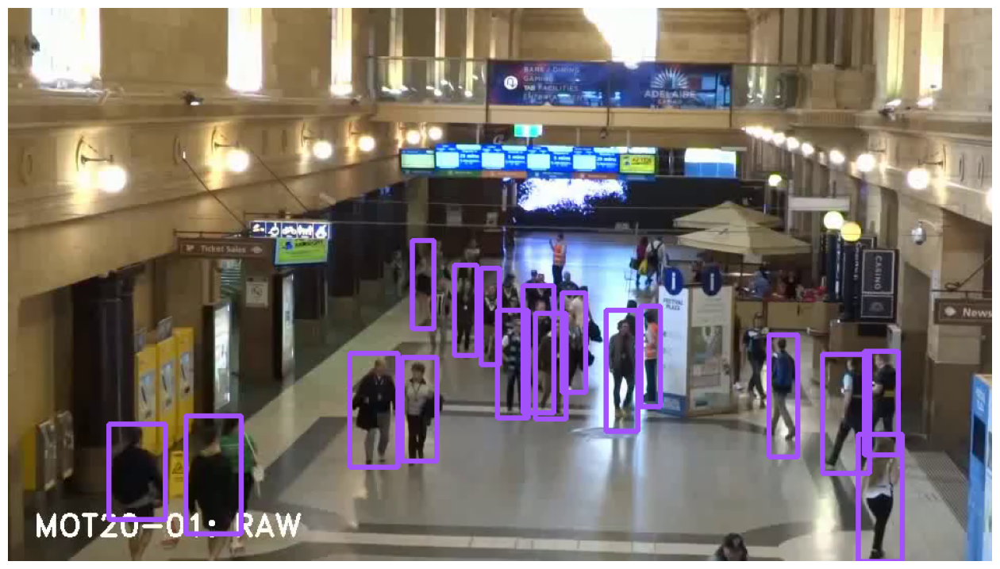

In [ ]:
import supervision as sv

#Specifying the input video path
video_path = "/content/drive/MyDrive/vid6.mp4"

#Creating the video frames generator, which will extract frames from the input video
generator = sv.get_video_frames_generator(video_path)

#Creating an iterator and getting the first frame
iterator = iter(generator)# Creating an iterator to access video frames
frame = next(iterator)#Gettinng the first frame from the iterator

results = model(frame, imgsz=1280)[0]#Performing inference on the first frame
detections = sv.Detections.from_ultralytics(results)# Converting the inference results into a format that can be used for bounding box annotations

box_annotator = sv.BoundingBoxAnnotator(thickness=4)# Create an object to annotate bounding boxes
frame = box_annotator.annotate(scene=frame, detections=detections)# Annotate the frame with bounding boxes around detected objects

#Displaying the annotated frame using the plot_image function in a 16x16 grid
%matplotlib inline
sv.plot_image(frame, (16, 16))


0: 736x1280 17 persons, 16.3ms
Speed: 16.1ms preprocess, 16.3ms inference, 2.1ms postprocess per image at shape (1, 3, 736, 1280)


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


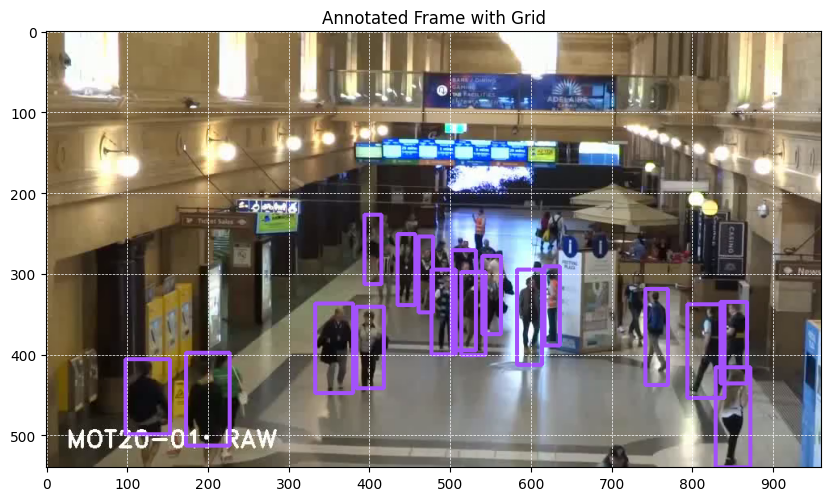

In [ ]:
# Specify the video path directly
video_path = "/content/drive/MyDrive/vid6.mp4"  # Replace with the actual path to your video

# Create the video frames generator
generator = sv.get_video_frames_generator(video_path)

#Creating an iterator and getting the first frame
iterator = iter(generator)# Creating an iterator to access video frames
frame = next(iterator)#Gettinng the first frame from the iterator

results = model(frame, imgsz=1280)[0]#Performing inference on the first frame
detections = sv.Detections.from_ultralytics(results)# Convert inference results into detections

box_annotator = sv.BoundingBoxAnnotator(thickness=4)#Creating an annotator with box of thickness 4
annotated_frame = box_annotator.annotate(scene=frame, detections=detections)#Annotate the frame with bounding boxes

# Convert the frame to RGB format for Matplotlib since for OpenCV it processses the image in BGR format
annotated_frame_rgb = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

# Plot the annotated frame with grid lines
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)#Display the annotated frame
plt.title("Annotated Frame with Grid")

# Add the customized grid lines to the plot
plt.grid(color='white', linestyle='--', linewidth=0.5)

# Set grid properties
plt.xticks(np.arange(0, annotated_frame_rgb.shape[1], 100))  # Setting the x-ticks (every 100 pixels)
plt.yticks(np.arange(0, annotated_frame_rgb.shape[0], 100))  # Setting the y-ticks (every 100 pixels)

plt.show()

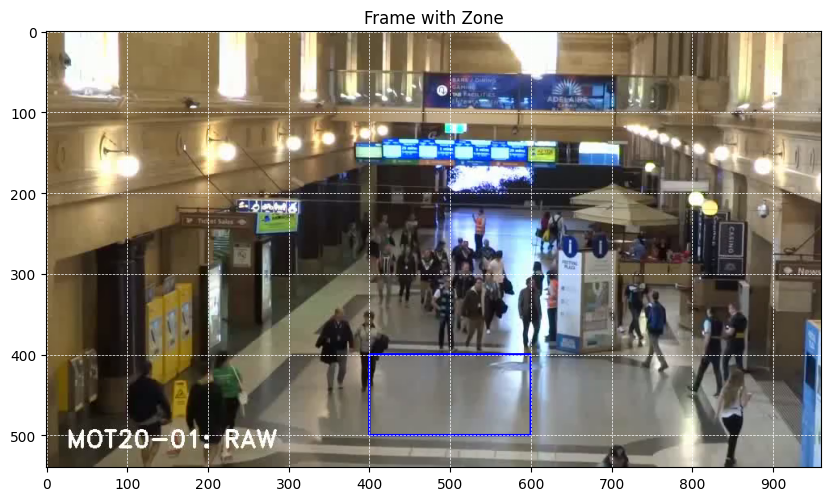

In [ ]:
video_path = "/content/drive/MyDrive/vid6.mp4"

generator = sv.get_video_frames_generator(video_path)

iterator = iter(generator)# Creating an iterator to access video frames
frame = next(iterator)#Gettinng the first frame from the iterator

# Defining zone as a rectangle (x1, y1, x2, y2)
zone = {"x1": 400, "y1": 400, "x2": 600, "y2": 500}
#x1, y1 represents the top left corner of the rectangle zone
#x2, y2 represents the bottom right corner of the rectangle zone

# Draw the zone on the frame
x1, y1, x2, y2 = zone["x1"], zone["y1"], zone["x2"], zone["y2"]
cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Draw a rectangle for the zone

# Convert frame to RGB for Matplotlib if required
frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Display the frame with the zone
plt.figure(figsize=(10, 10))
plt.imshow(frame_rgb)
plt.title("Frame with Zone")
plt.grid(color='white', linestyle='--', linewidth=0.5)

# Add grid lines for measurement
plt.xticks(np.arange(0, frame_rgb.shape[1], 100))
plt.yticks(np.arange(0, frame_rgb.shape[0], 100))

plt.show()


0: 384x640 18 persons, 68.7ms
Speed: 3.1ms preprocess, 68.7ms inference, 3.1ms postprocess per image at shape (1, 3, 384, 640)


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


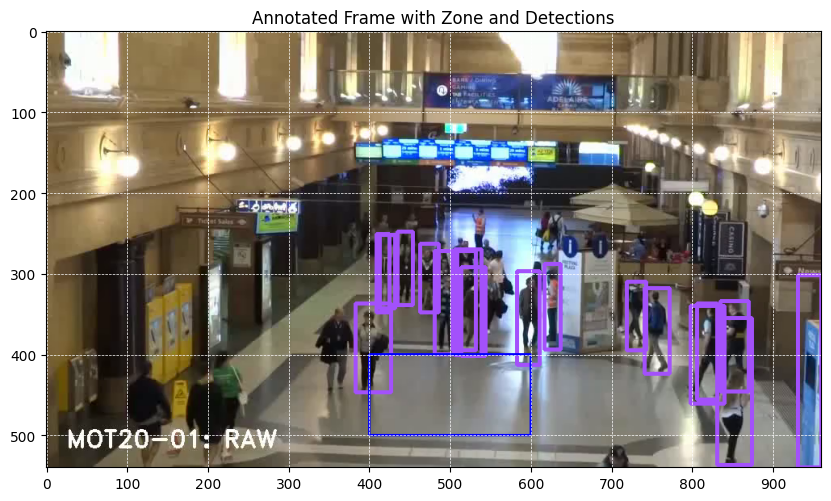

In [ ]:
video_path = "/content/drive/MyDrive/vid6.mp4"

model = YOLO('/content/runs/detect/train/weights/best.pt')

# Create the video frames generator
generator = sv.get_video_frames_generator(video_path)

# Create an iterator and get the first frame
iterator = iter(generator)
frame = next(iterator)

# Perform inference on the first frame
results = model(frame)[0]
detections = sv.Detections.from_ultralytics(results)

# Annotate only bounding boxes
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
annotated_frame = box_annotator.annotate(scene=frame, detections=detections)

# Define a single zone as a rectangle (x1, y1, x2, y2)
zone = {"x1": 400, "y1": 400, "x2": 600, "y2": 500}

# Draw the zone on the frame
x1, y1, x2, y2 = zone["x1"], zone["y1"], zone["x2"], zone["y2"]
cv2.rectangle(annotated_frame, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Draw a rectangle for the zone

# Convert the frame to RGB format for Matplotlib (if needed)
annotated_frame_rgb = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

# Plot the annotated frame with grid lines
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.title("Annotated Frame with Zone and Detections")

# Add grid lines
plt.grid(color='white', linestyle='--', linewidth=0.5)

# Set grid properties (optional, e.g., based on pixels)
plt.xticks(np.arange(0, annotated_frame_rgb.shape[1], 100))  # Set x-ticks (every 100 pixels)
plt.yticks(np.arange(0, annotated_frame_rgb.shape[0], 100))  # Set y-ticks (every 100 pixels)

plt.show()

SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.



0: 384x640 18 persons, 31.2ms
Speed: 6.7ms preprocess, 31.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


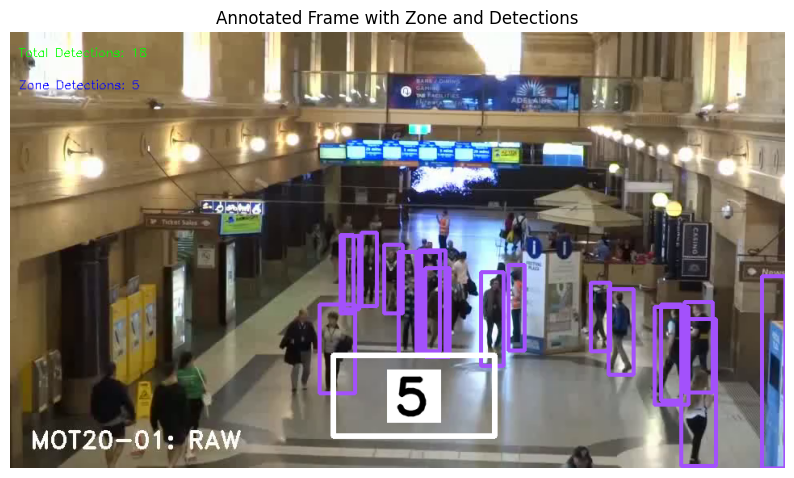

In [ ]:
video_path = "/content/drive/MyDrive/vid6.mp4"
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Define zone polygon
polygon = np.array([
    [400, 400],
    [600, 400],
    [600, 500],
    [400, 500]
])

# Create zone and annotators
zone = sv.PolygonZone(polygon=polygon)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
zone_annotator = sv.PolygonZoneAnnotator(
    zone=zone,
    color=sv.Color.WHITE,
    thickness=6,
    text_thickness=6,
    text_scale=2  # Reduced text scale inside the zone for smaller counter
)

# Create video frames generator
generator = sv.get_video_frames_generator(video_path)
iterator = iter(generator)

# Tracking variables
total_detections = 0
zone_detections = 0

# Process first frame
frame = next(iterator)
results = model(frame)[0]
detections = sv.Detections.from_ultralytics(results)

zone.trigger(detections=detections)# Trigger the zone detection based on the current frame's detections

total_detections = len(detections)# Count the total number of detections in the frame
zone_detections = sum(zone.trigger(detections=detections))#Count how many of those detections fall inside the defined zone

#Draw bounding boxes around detected objects
annotated_frame = box_annotator.annotate(scene=frame, detections=detections)
annotated_frame = zone_annotator.annotate(scene=annotated_frame)

# Add overlay text on the frame to show the total and zone-specific detection counts
# Display the total detections at the top-left corner
cv2.putText(
    annotated_frame,
    f"Total Detections: {total_detections}",
    (10, 30),# Position of the text
    cv2.FONT_HERSHEY_SIMPLEX,# Font style
    0.5,  # Font size
    (0, 255, 0),# Green color for total detections
    1 # Thickness of the text
)

# Display the zone-specific detections count below the total detections text
cv2.putText(
    annotated_frame,
    f"Zone Detections: {zone_detections}",
    (10, 70),# Position of the text
    cv2.FONT_HERSHEY_SIMPLEX,# Font style
    0.5, # Font size
    (255, 0, 0),
    1  #Thickness of text
)

# Convert the annotated frame from BGR to RGB for displaying with Matplotlib
annotated_frame_rgb = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

# Display the annotated frame with Matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.title("Annotated Frame with Zone and Detections")
plt.axis('off')
plt.show()

In [ ]:

video_path = "/content/drive/MyDrive/vid6.mp4"
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Define zone polygon
polygon = np.array([
    [400, 400],
    [600, 400],
    [600, 500],
    [400, 500]
])

# Creating zone and annotators
zone = sv.PolygonZone(polygon=polygon)# Create a zone using the defined polygon
box_annotator = sv.BoundingBoxAnnotator(thickness=4)# Create a bounding box annotator with a thickness of 4
zone_annotator = sv.PolygonZoneAnnotator(#Annotator for drawing the zone and showing related information
    zone=zone,#The zone to annotate
    color=sv.Color.WHITE,#Color for the zone outline
    thickness=6,#Thickness of the zone outline
    text_thickness=6,#Thickness of the text
    text_scale=2  # Scale of the text
)

# Create video frames generator
generator = sv.get_video_frames_generator(video_path) # Generate frames from the input video
iterator = iter(generator)# Create an iterator for the frame generator

# Output video setup
output_video_path = "/content/drive/MyDrive/count6.mp4"# Path to save the output vide
frame_width = int(next(iterator).shape[1])  # Get the width from the first frame
frame_height = int(next(iterator).shape[0])  # Get the height from the first frame
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for .mp4 format
out_video = cv2.VideoWriter(output_video_path, fourcc, 30, (frame_width, frame_height))# Initialize the VideoWriter to save the video


# Reset the iterator to process all frames
iterator = iter(generator)

# Process video frames
for frame in iterator:
    results = model(frame)[0]# Run the YOLO model on the current frame
    detections = sv.Detections.from_ultralytics(results) #Convert the YOLO results to a Detection format used by the `supervision` library

    # Filter and process detections
    zone.trigger(detections=detections)  #Checking if any detections fall within the zone

    # Count detections
    total_detections = len(detections) # Total number of detections
    zone_detections = sum(zone.trigger(detections=detections))# Number of detections within the zone

    # Annotate the frame with bounding boxes and the zone
    annotated_frame = box_annotator.annotate(scene=frame, detections=detections) # Draw bounding boxes around detected objects
    annotated_frame = zone_annotator.annotate(scene=annotated_frame)# Annotate the zone on the frame

     # Adding the text overlays with counters for total detections and zone detections
    cv2.putText(
        annotated_frame,
        f"Total Detections: {total_detections}",
        (10, 30), # Position of the text (x, y)
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,  # Smaller font size
        (0, 255, 0),
        1  # Adjusted thickness
    )
    cv2.putText(
        annotated_frame,
        f"Zone Detections: {zone_detections}",
        (10, 70),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,  # Smaller font size
        (255, 0, 0),
        1  # Adjusted thickness
    )
    out_video.write(annotated_frame) # Save the current annotated frame to the output video

out_video.release() # Release the VideoWriter to finalize the video file
cv2.destroyAllWindows()# Close all OpenCV windows (if any are opened)

print(f"Annotated video saved to {output_video_path}")


0: 384x640 17 persons, 9.7ms
Speed: 2.1ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 8.2ms
Speed: 2.6ms preprocess, 8.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


0: 384x640 16 persons, 9.3ms
Speed: 2.9ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 persons, 7.5ms
Speed: 2.5ms preprocess, 7.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 6.5ms
Speed: 2.5ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 6.5ms
Speed: 2.5ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 8.5ms
Speed: 2.0ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384

Tracking on video 1


0: 736x1280 6 persons, 167.6ms
Speed: 25.6ms preprocess, 167.6ms inference, 2.3ms postprocess per image at shape (1, 3, 736, 1280)


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


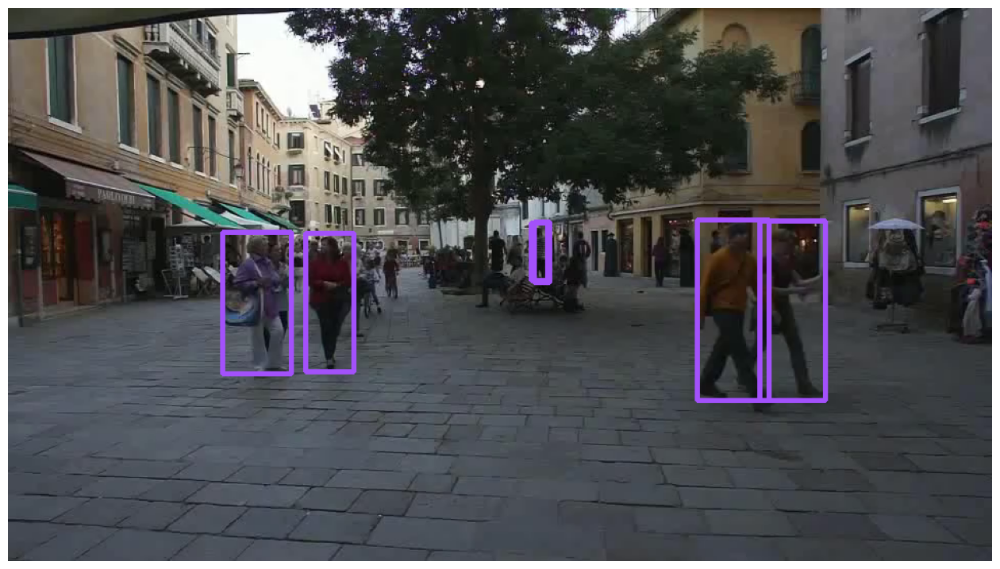

In [12]:
import supervision as sv

# Specify the video path directly
video_path = "/content/drive/MyDrive/vid1.mp4"

# Create the video frames generator
generator = sv.get_video_frames_generator(video_path)

# Create an iterator and get the first frame
iterator = iter(generator)
frame = next(iterator)

# Perform inference on the first frame
results = model(frame, imgsz=1280)[0]
detections = sv.Detections.from_ultralytics(results)

# Annotate only bounding boxes (skip label annotation)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
frame = box_annotator.annotate(scene=frame, detections=detections)

# Display the annotated frame
%matplotlib inline
sv.plot_image(frame, (16, 16))

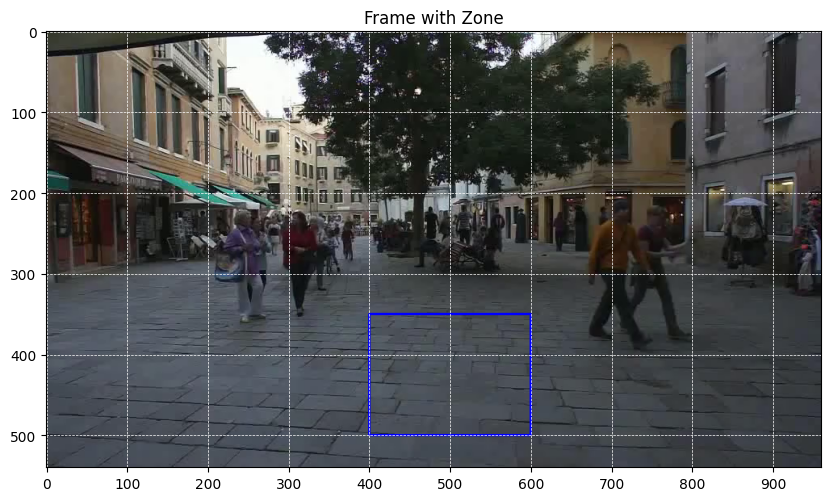

In [17]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Specify the video path directly
video_path = "/content/drive/MyDrive/vid1.mp4"  # Replace with the actual path to your video

# Create the video frames generator
generator = sv.get_video_frames_generator(video_path)

# Create an iterator and get the first frame
iterator = iter(generator)
frame = next(iterator)

# Define a single zone as a rectangle (x1, y1, x2, y2)
zone = {"x1": 400, "y1": 350, "x2": 600, "y2": 500}
#x1, y1 represent the top-left corner of the rectangle.
#x2, y2 represent the bottom-right corner of the rectangle.

# Draw the zone on the frame
x1, y1, x2, y2 = zone["x1"], zone["y1"], zone["x2"], zone["y2"]
cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Draw a rectangle for the zone

# Convert frame to RGB for Matplotlib
frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Display the frame with the zone
plt.figure(figsize=(10, 10))
plt.imshow(frame_rgb)
plt.title("Frame with Zone")
plt.grid(color='white', linestyle='--', linewidth=0.5)

# Add grid lines for measurement
plt.xticks(np.arange(0, frame_rgb.shape[1], 100))
plt.yticks(np.arange(0, frame_rgb.shape[0], 100))

plt.show()


0: 384x640 6 persons, 11.3ms
Speed: 2.0ms preprocess, 11.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


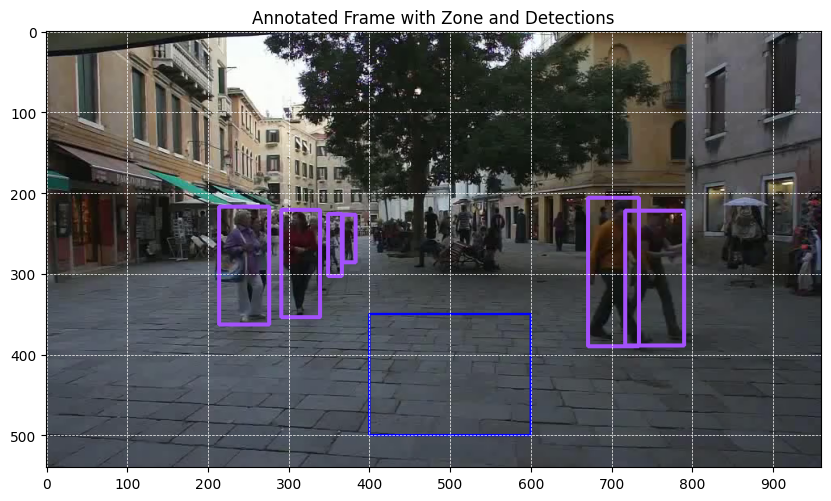

In [16]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

# Specify the video path directly
video_path = "/content/drive/MyDrive/vid1.mp4"

# Load the trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')  # Use your trained model path

# Create the video frames generator
generator = sv.get_video_frames_generator(video_path)

# Create an iterator and get the first frame
iterator = iter(generator)
frame = next(iterator)

# Perform inference on the first frame
results = model(frame)[0]
detections = sv.Detections.from_ultralytics(results)

# Annotate only bounding boxes (skip label annotation)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
annotated_frame = box_annotator.annotate(scene=frame, detections=detections)

# Define a single zone as a rectangle (x1, y1, x2, y2)
zone = {"x1": 400, "y1": 350, "x2": 600, "y2": 500}

# Draw the zone on the frame
x1, y1, x2, y2 = zone["x1"], zone["y1"], zone["x2"], zone["y2"]
cv2.rectangle(annotated_frame, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Draw a rectangle for the zone

# Convert the frame to RGB format for Matplotlib (if needed)
annotated_frame_rgb = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

# Plot the annotated frame with grid lines
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.title("Annotated Frame with Zone and Detections")

# Add grid lines
plt.grid(color='white', linestyle='--', linewidth=0.5)

# Set grid properties (optional, e.g., based on pixels)
plt.xticks(np.arange(0, annotated_frame_rgb.shape[1], 100))  # Set x-ticks (every 100 pixels)
plt.yticks(np.arange(0, annotated_frame_rgb.shape[0], 100))  # Set y-ticks (every 100 pixels)

plt.show()


0: 384x640 6 persons, 8.9ms
Speed: 2.0ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


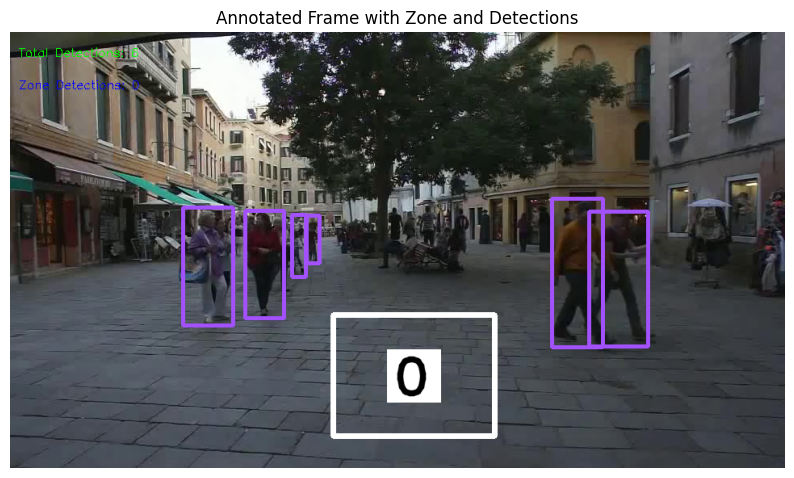

In [19]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

# Video and model setup
video_path = "/content/drive/MyDrive/vid1.mp4"
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Define zone polygon
polygon = np.array([
    [400, 350],
    [600, 350],
    [600, 500],
    [400, 500]
])

# Create zone and annotators
zone = sv.PolygonZone(polygon=polygon)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
zone_annotator = sv.PolygonZoneAnnotator(
    zone=zone,
    color=sv.Color.WHITE,
    thickness=6,
    text_thickness=6,
    text_scale=2  # Reduced text scale inside the zone for smaller counter
)

# Create video frames generator
generator = sv.get_video_frames_generator(video_path)
iterator = iter(generator)

# Tracking variables
total_detections = 0
zone_detections = 0

# Process first frame
frame = next(iterator)
results = model(frame)[0]
detections = sv.Detections.from_ultralytics(results)

# Filter and process detections
zone.trigger(detections=detections)

# Count detections
total_detections = len(detections)
zone_detections = sum(zone.trigger(detections=detections))

# Annotate frame without confidence score or label name
annotated_frame = box_annotator.annotate(scene=frame, detections=detections)
annotated_frame = zone_annotator.annotate(scene=annotated_frame)

# Add text overlays with smaller font size for counters outside the zone
cv2.putText(
    annotated_frame,
    f"Total Detections: {total_detections}",
    (10, 30),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.5,  # Smaller font size
    (0, 255, 0),
    1  # Adjusted thickness
)
cv2.putText(
    annotated_frame,
    f"Zone Detections: {zone_detections}",
    (10, 70),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.5,  # Smaller font size
    (255, 0, 0),
    1  # Adjusted thickness
)

# Convert and display
annotated_frame_rgb = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.title("Annotated Frame with Zone and Detections")
plt.axis('off')
plt.show()

In [21]:
import supervision as sv
import cv2
import numpy as np
from ultralytics import YOLO

# Video and model setup
video_path = "/content/drive/MyDrive/vid1.mp4"
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Define zone polygon
polygon = np.array([
    [400, 350],
    [600, 350],
    [600, 500],
    [400, 500]
])
# Create zone and annotators
zone = sv.PolygonZone(polygon=polygon)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
zone_annotator = sv.PolygonZoneAnnotator(
    zone=zone,
    color=sv.Color.WHITE,
    thickness=6,
    text_thickness=6,
    text_scale=2  # Reduced text scale inside the zone for smaller counter
)

# Create video frames generator
generator = sv.get_video_frames_generator(video_path)
iterator = iter(generator)

# Output video setup
output_video_path = "/content/drive/MyDrive/count1.mp4"
frame_width = int(next(iterator).shape[1])  # Get the width from the first frame
frame_height = int(next(iterator).shape[0])  # Get the height from the first frame
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for .mp4 format
out_video = cv2.VideoWriter(output_video_path, fourcc, 30, (frame_width, frame_height))

# Reset the iterator to process all frames
iterator = iter(generator)

# Process video frames
for frame in iterator:
    results = model(frame)[0]
    detections = sv.Detections.from_ultralytics(results)

    # Filter and process detections
    zone.trigger(detections=detections)

    # Count detections
    total_detections = len(detections)
    zone_detections = sum(zone.trigger(detections=detections))

    # Annotate frame without confidence score or label name
    annotated_frame = box_annotator.annotate(scene=frame, detections=detections)
    annotated_frame = zone_annotator.annotate(scene=annotated_frame)

    # Add text overlays with smaller font size for counters outside the zone
    cv2.putText(
        annotated_frame,
        f"Total Detections: {total_detections}",
        (10, 30),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,  # Smaller font size
        (0, 255, 0),
        1  # Adjusted thickness
    )
    cv2.putText(
        annotated_frame,
        f"Zone Detections: {zone_detections}",
        (10, 70),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,  # Smaller font size
        (255, 0, 0),
        1  # Adjusted thickness
    )

    # Write the annotated frame to the output video
    out_video.write(annotated_frame)

# Release the video writer and clean up
out_video.release()
cv2.destroyAllWindows()

print(f"Annotated video saved to {output_video_path}")


0: 384x640 5 persons, 11.3ms
Speed: 2.2ms preprocess, 11.3ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)



SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


0: 384x640 5 persons, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 persons, 7.6ms
Speed: 3.1ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 persons, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 persons, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 persons, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 persons, 8.3ms
Speed: 2.9ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 persons, 8.3ms
Speed: 3.0ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 persons, 8.0ms
Speed: 3.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

Tracking on video 2


0: 736x1280 4 persons, 13.9ms
Speed: 8.0ms preprocess, 13.9ms inference, 2.3ms postprocess per image at shape (1, 3, 736, 1280)


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


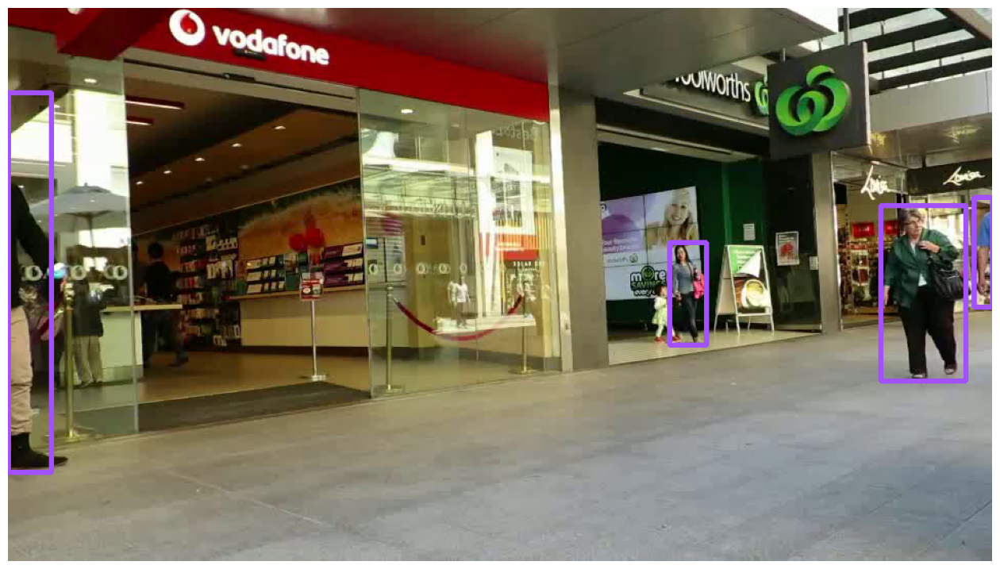

In [22]:
import supervision as sv

# Specify the video path directly
video_path = "/content/drive/MyDrive/vid2.mp4"

# Create the video frames generator
generator = sv.get_video_frames_generator(video_path)

# Create an iterator and get the first frame
iterator = iter(generator)
frame = next(iterator)

# Perform inference on the first frame
results = model(frame, imgsz=1280)[0]
detections = sv.Detections.from_ultralytics(results)

# Annotate only bounding boxes (skip label annotation)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
frame = box_annotator.annotate(scene=frame, detections=detections)

# Display the annotated frame
%matplotlib inline
sv.plot_image(frame, (16, 16))

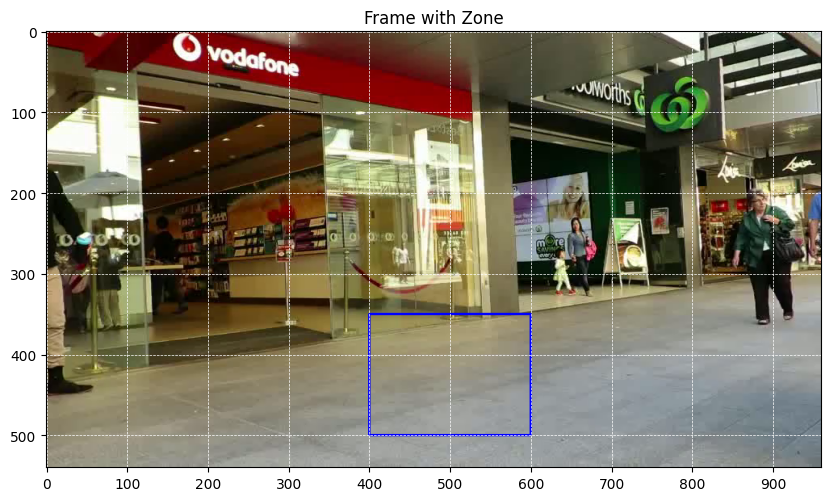

In [23]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Specify the video path directly
video_path = "/content/drive/MyDrive/vid2.mp4"  # Replace with the actual path to your video

# Create the video frames generator
generator = sv.get_video_frames_generator(video_path)

# Create an iterator and get the first frame
iterator = iter(generator)
frame = next(iterator)

# Define a single zone as a rectangle (x1, y1, x2, y2)
zone = {"x1": 400, "y1": 350, "x2": 600, "y2": 500}
#x1, y1 represent the top-left corner of the rectangle.
#x2, y2 represent the bottom-right corner of the rectangle.

# Draw the zone on the frame
x1, y1, x2, y2 = zone["x1"], zone["y1"], zone["x2"], zone["y2"]
cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Draw a rectangle for the zone

# Convert frame to RGB for Matplotlib
frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Display the frame with the zone
plt.figure(figsize=(10, 10))
plt.imshow(frame_rgb)
plt.title("Frame with Zone")
plt.grid(color='white', linestyle='--', linewidth=0.5)

# Add grid lines for measurement
plt.xticks(np.arange(0, frame_rgb.shape[1], 100))
plt.yticks(np.arange(0, frame_rgb.shape[0], 100))

plt.show()


0: 384x640 1 person, 22.4ms
Speed: 3.1ms preprocess, 22.4ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


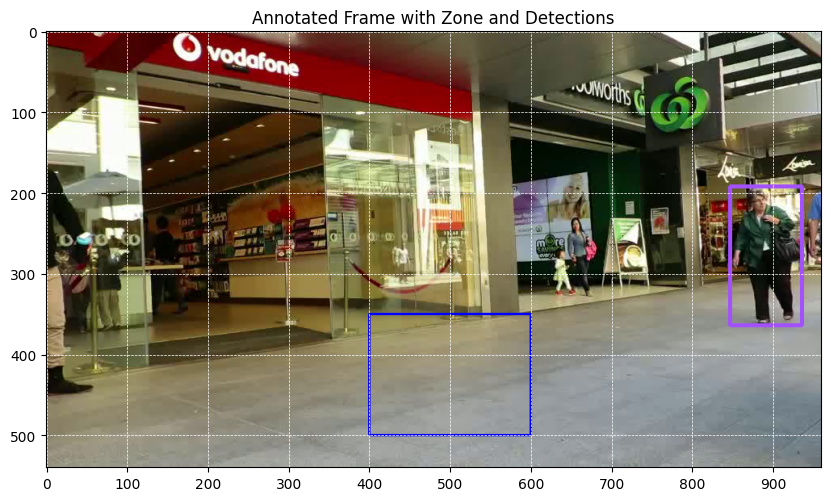

In [24]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

# Specify the video path directly
video_path = "/content/drive/MyDrive/vid2.mp4"

# Load the trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')  # Use your trained model path

# Create the video frames generator
generator = sv.get_video_frames_generator(video_path)

# Create an iterator and get the first frame
iterator = iter(generator)
frame = next(iterator)

# Perform inference on the first frame
results = model(frame)[0]
detections = sv.Detections.from_ultralytics(results)

# Annotate only bounding boxes (skip label annotation)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
annotated_frame = box_annotator.annotate(scene=frame, detections=detections)

# Define a single zone as a rectangle (x1, y1, x2, y2)
zone = {"x1": 400, "y1": 350, "x2": 600, "y2": 500}

# Draw the zone on the frame
x1, y1, x2, y2 = zone["x1"], zone["y1"], zone["x2"], zone["y2"]
cv2.rectangle(annotated_frame, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Draw a rectangle for the zone

# Convert the frame to RGB format for Matplotlib (if needed)
annotated_frame_rgb = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

# Plot the annotated frame with grid lines
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.title("Annotated Frame with Zone and Detections")

# Add grid lines
plt.grid(color='white', linestyle='--', linewidth=0.5)

# Set grid properties (optional, e.g., based on pixels)
plt.xticks(np.arange(0, annotated_frame_rgb.shape[1], 100))  # Set x-ticks (every 100 pixels)
plt.yticks(np.arange(0, annotated_frame_rgb.shape[0], 100))  # Set y-ticks (every 100 pixels)

plt.show()

SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.



0: 384x640 1 person, 21.2ms
Speed: 3.2ms preprocess, 21.2ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)


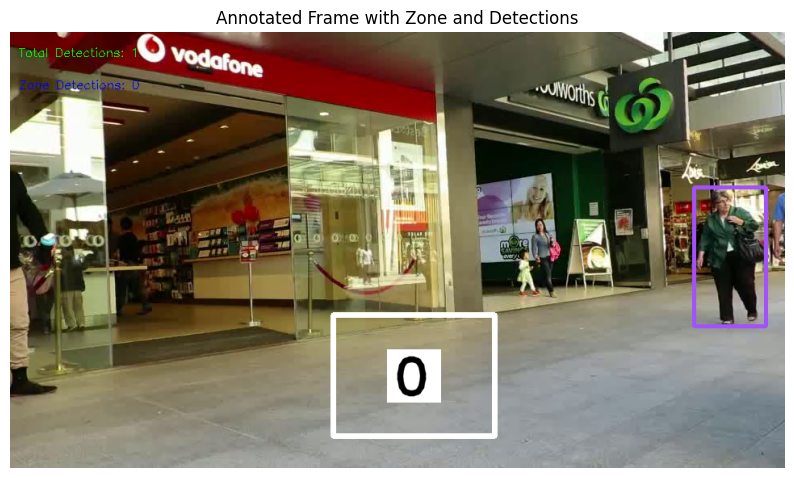

In [25]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

# Video and model setup
video_path = "/content/drive/MyDrive/vid2.mp4"
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Define zone polygon
polygon = np.array([
    [400, 350],
    [600, 350],
    [600, 500],
    [400, 500]
])

# Create zone and annotators
zone = sv.PolygonZone(polygon=polygon)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
zone_annotator = sv.PolygonZoneAnnotator(
    zone=zone,
    color=sv.Color.WHITE,
    thickness=6,
    text_thickness=6,
    text_scale=2  # Reduced text scale inside the zone for smaller counter
)

# Create video frames generator
generator = sv.get_video_frames_generator(video_path)
iterator = iter(generator)

# Tracking variables
total_detections = 0
zone_detections = 0

# Process first frame
frame = next(iterator)
results = model(frame)[0]
detections = sv.Detections.from_ultralytics(results)

# Filter and process detections
zone.trigger(detections=detections)

# Count detections
total_detections = len(detections)
zone_detections = sum(zone.trigger(detections=detections))

# Annotate frame without confidence score or label name
annotated_frame = box_annotator.annotate(scene=frame, detections=detections)
annotated_frame = zone_annotator.annotate(scene=annotated_frame)

# Add text overlays with smaller font size for counters outside the zone
cv2.putText(
    annotated_frame,
    f"Total Detections: {total_detections}",
    (10, 30),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.5,  # Smaller font size
    (0, 255, 0),
    1  # Adjusted thickness
)
cv2.putText(
    annotated_frame,
    f"Zone Detections: {zone_detections}",
    (10, 70),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.5,  # Smaller font size
    (255, 0, 0),
    1  # Adjusted thickness
)

# Convert and display
annotated_frame_rgb = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.title("Annotated Frame with Zone and Detections")
plt.axis('off')
plt.show()

In [26]:
import supervision as sv
import cv2
import numpy as np
from ultralytics import YOLO

# Video and model setup
video_path = "/content/drive/MyDrive/vid2.mp4"
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Define zone polygon
polygon = np.array([
    [400, 350],
    [600, 350],
    [600, 500],
    [400, 500]
])
# Create zone and annotators
zone = sv.PolygonZone(polygon=polygon)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
zone_annotator = sv.PolygonZoneAnnotator(
    zone=zone,
    color=sv.Color.WHITE,
    thickness=6,
    text_thickness=6,
    text_scale=2  # Reduced text scale inside the zone for smaller counter
)

# Create video frames generator
generator = sv.get_video_frames_generator(video_path)
iterator = iter(generator)

# Output video setup
output_video_path = "/content/drive/MyDrive/count2.mp4"
frame_width = int(next(iterator).shape[1])  # Get the width from the first frame
frame_height = int(next(iterator).shape[0])  # Get the height from the first frame
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for .mp4 format
out_video = cv2.VideoWriter(output_video_path, fourcc, 30, (frame_width, frame_height))

# Reset the iterator to process all frames
iterator = iter(generator)

# Process video frames
for frame in iterator:
    results = model(frame)[0]
    detections = sv.Detections.from_ultralytics(results)

    # Filter and process detections
    zone.trigger(detections=detections)

    # Count detections
    total_detections = len(detections)
    zone_detections = sum(zone.trigger(detections=detections))

    # Annotate frame without confidence score or label name
    annotated_frame = box_annotator.annotate(scene=frame, detections=detections)
    annotated_frame = zone_annotator.annotate(scene=annotated_frame)

    # Add text overlays with smaller font size for counters outside the zone
    cv2.putText(
        annotated_frame,
        f"Total Detections: {total_detections}",
        (10, 30),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,  # Smaller font size
        (0, 255, 0),
        1  # Adjusted thickness
    )
    cv2.putText(
        annotated_frame,
        f"Zone Detections: {zone_detections}",
        (10, 70),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,  # Smaller font size
        (255, 0, 0),
        1  # Adjusted thickness
    )

    # Write the annotated frame to the output video
    out_video.write(annotated_frame)

# Release the video writer and clean up
out_video.release()
cv2.destroyAllWindows()

print(f"Annotated video saved to {output_video_path}")

SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.



0: 384x640 4 persons, 14.8ms
Speed: 3.1ms preprocess, 14.8ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 persons, 11.2ms
Speed: 3.1ms preprocess, 11.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 persons, 11.7ms
Speed: 3.1ms preprocess, 11.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 persons, 32.1ms
Speed: 3.0ms preprocess, 32.1ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 persons, 11.0ms
Speed: 3.3ms preprocess, 11.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 persons, 16.2ms
Speed: 3.0ms preprocess, 16.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 persons, 11.6ms
Speed: 3.3ms preprocess, 11.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 persons, 14.0ms
Speed: 3.1ms preprocess, 14.0ms inference, 2.2ms postprocess per image at shape (

Tracking on video 8


0: 960x1280 3 persons, 176.2ms
Speed: 36.1ms preprocess, 176.2ms inference, 2.2ms postprocess per image at shape (1, 3, 960, 1280)


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


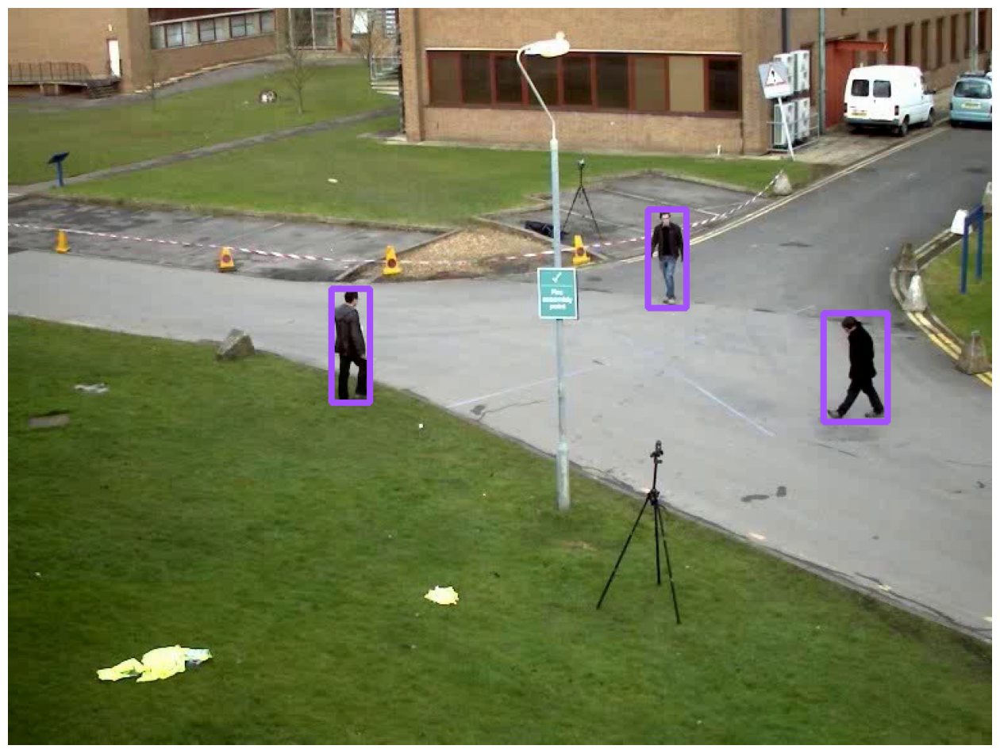

In [27]:
import supervision as sv

# Specify the video path directly
video_path = "/content/drive/MyDrive/vid8.mp4"

# Create the video frames generator
generator = sv.get_video_frames_generator(video_path)

# Create an iterator and get the first frame
iterator = iter(generator)
frame = next(iterator)

# Perform inference on the first frame
results = model(frame, imgsz=1280)[0]
detections = sv.Detections.from_ultralytics(results)

# Annotate only bounding boxes (skip label annotation)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
frame = box_annotator.annotate(scene=frame, detections=detections)

# Display the annotated frame
%matplotlib inline
sv.plot_image(frame, (16, 16))

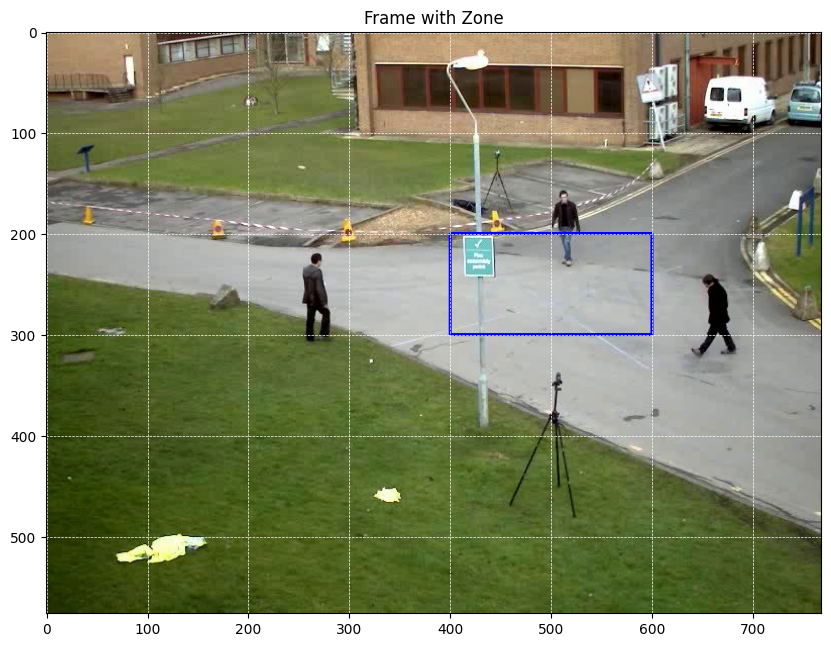

In [29]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Specify the video path directly
video_path = "/content/drive/MyDrive/vid8.mp4"  # Replace with the actual path to your video

# Create the video frames generator
generator = sv.get_video_frames_generator(video_path)

# Create an iterator and get the first frame
iterator = iter(generator)
frame = next(iterator)

# Define a single zone as a rectangle (x1, y1, x2, y2)
zone = {"x1": 400, "y1": 200, "x2": 600, "y2": 300}
#x1, y1 represent the top-left corner of the rectangle.
#x2, y2 represent the bottom-right corner of the rectangle.

# Draw the zone on the frame
x1, y1, x2, y2 = zone["x1"], zone["y1"], zone["x2"], zone["y2"]
cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Draw a rectangle for the zone

# Convert frame to RGB for Matplotlib
frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Display the frame with the zone
plt.figure(figsize=(10, 10))
plt.imshow(frame_rgb)
plt.title("Frame with Zone")
plt.grid(color='white', linestyle='--', linewidth=0.5)

# Add grid lines for measurement
plt.xticks(np.arange(0, frame_rgb.shape[1], 100))
plt.yticks(np.arange(0, frame_rgb.shape[0], 100))

plt.show()


0: 480x640 3 persons, 37.4ms
Speed: 2.8ms preprocess, 37.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


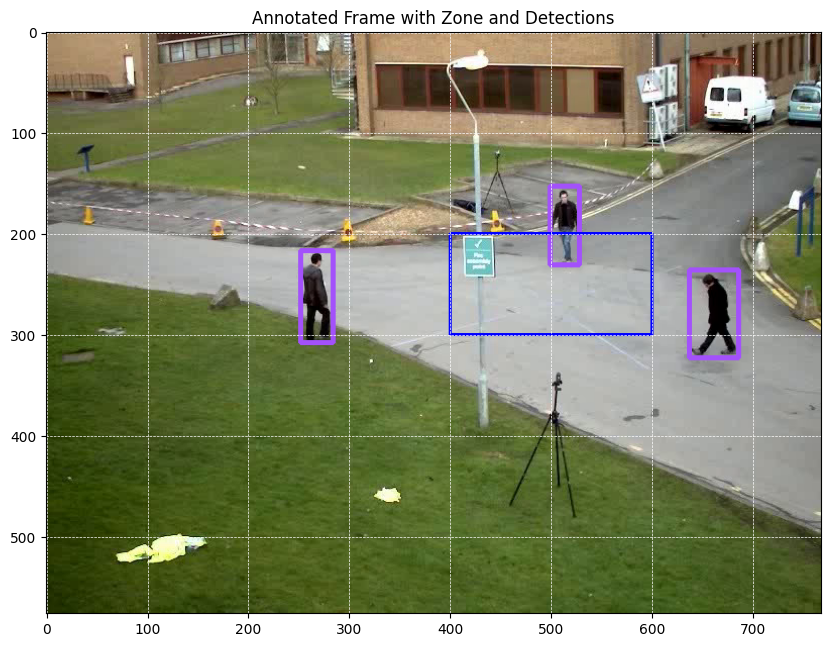

In [30]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

# Specify the video path directly
video_path = "/content/drive/MyDrive/vid8.mp4"

# Load the trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')  # Use your trained model path

# Create the video frames generator
generator = sv.get_video_frames_generator(video_path)

# Create an iterator and get the first frame
iterator = iter(generator)
frame = next(iterator)

# Perform inference on the first frame
results = model(frame)[0]
detections = sv.Detections.from_ultralytics(results)

# Annotate only bounding boxes (skip label annotation)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
annotated_frame = box_annotator.annotate(scene=frame, detections=detections)

# Define a single zone as a rectangle (x1, y1, x2, y2)
zone = {"x1": 400, "y1": 200, "x2": 600, "y2": 300}

# Draw the zone on the frame
x1, y1, x2, y2 = zone["x1"], zone["y1"], zone["x2"], zone["y2"]
cv2.rectangle(annotated_frame, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Draw a rectangle for the zone

# Convert the frame to RGB format for Matplotlib (if needed)
annotated_frame_rgb = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

# Plot the annotated frame with grid lines
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.title("Annotated Frame with Zone and Detections")

# Add grid lines
plt.grid(color='white', linestyle='--', linewidth=0.5)

# Set grid properties (optional, e.g., based on pixels)
plt.xticks(np.arange(0, annotated_frame_rgb.shape[1], 100))  # Set x-ticks (every 100 pixels)
plt.yticks(np.arange(0, annotated_frame_rgb.shape[0], 100))  # Set y-ticks (every 100 pixels)

plt.show()

SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.



0: 480x640 3 persons, 29.2ms
Speed: 9.1ms preprocess, 29.2ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)


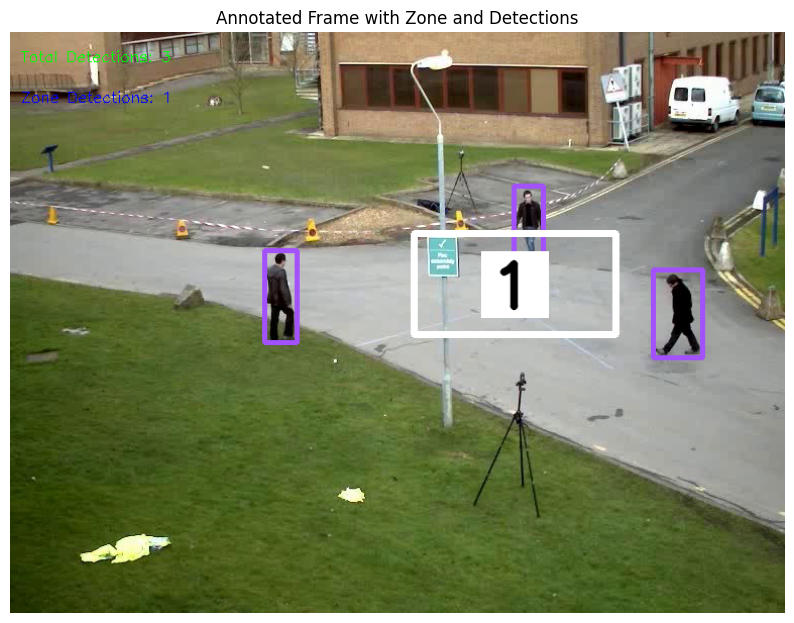

In [31]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

# Video and model setup
video_path = "/content/drive/MyDrive/vid8.mp4"
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Define zone polygon
polygon = np.array([
    [400, 200],
    [600, 200],
    [600, 300],
    [400, 300]
])

# Create zone and annotators
zone = sv.PolygonZone(polygon=polygon)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
zone_annotator = sv.PolygonZoneAnnotator(
    zone=zone,
    color=sv.Color.WHITE,
    thickness=6,
    text_thickness=6,
    text_scale=2  # Reduced text scale inside the zone for smaller counter
)

# Create video frames generator
generator = sv.get_video_frames_generator(video_path)
iterator = iter(generator)

# Tracking variables
total_detections = 0
zone_detections = 0

# Process first frame
frame = next(iterator)
results = model(frame)[0]
detections = sv.Detections.from_ultralytics(results)

# Filter and process detections
zone.trigger(detections=detections)

# Count detections
total_detections = len(detections)
zone_detections = sum(zone.trigger(detections=detections))

# Annotate frame without confidence score or label name
annotated_frame = box_annotator.annotate(scene=frame, detections=detections)
annotated_frame = zone_annotator.annotate(scene=annotated_frame)

# Add text overlays with smaller font size for counters outside the zone
cv2.putText(
    annotated_frame,
    f"Total Detections: {total_detections}",
    (10, 30),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.5,  # Smaller font size
    (0, 255, 0),
    1  # Adjusted thickness
)
cv2.putText(
    annotated_frame,
    f"Zone Detections: {zone_detections}",
    (10, 70),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.5,  # Smaller font size
    (255, 0, 0),
    1  # Adjusted thickness
)

# Convert and display
annotated_frame_rgb = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.title("Annotated Frame with Zone and Detections")
plt.axis('off')
plt.show()

In [32]:
import supervision as sv
import cv2
import numpy as np
from ultralytics import YOLO

# Video and model setup
video_path = "/content/drive/MyDrive/vid8.mp4"
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Define zone polygon
polygon = np.array([
    [400, 200],
    [600, 200],
    [600, 300],
    [400, 300]
])
# Create zone and annotators
zone = sv.PolygonZone(polygon=polygon)
box_annotator = sv.BoundingBoxAnnotator(thickness=4)
zone_annotator = sv.PolygonZoneAnnotator(
    zone=zone,
    color=sv.Color.WHITE,
    thickness=6,
    text_thickness=6,
    text_scale=2  # Reduced text scale inside the zone for smaller counter
)

# Create video frames generator
generator = sv.get_video_frames_generator(video_path)
iterator = iter(generator)

# Output video setup
output_video_path = "/content/drive/MyDrive/count8.mp4"
frame_width = int(next(iterator).shape[1])  # Get the width from the first frame
frame_height = int(next(iterator).shape[0])  # Get the height from the first frame
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for .mp4 format
out_video = cv2.VideoWriter(output_video_path, fourcc, 30, (frame_width, frame_height))

# Reset the iterator to process all frames
iterator = iter(generator)

# Process video frames
for frame in iterator:
    results = model(frame)[0]
    detections = sv.Detections.from_ultralytics(results)

    # Filter and process detections
    zone.trigger(detections=detections)

    # Count detections
    total_detections = len(detections)
    zone_detections = sum(zone.trigger(detections=detections))

    # Annotate frame without confidence score or label name
    annotated_frame = box_annotator.annotate(scene=frame, detections=detections)
    annotated_frame = zone_annotator.annotate(scene=annotated_frame)

    # Add text overlays with smaller font size for counters outside the zone
    cv2.putText(
        annotated_frame,
        f"Total Detections: {total_detections}",
        (10, 30),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,  # Smaller font size
        (0, 255, 0),
        1  # Adjusted thickness
    )
    cv2.putText(
        annotated_frame,
        f"Zone Detections: {zone_detections}",
        (10, 70),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,  # Smaller font size
        (255, 0, 0),
        1  # Adjusted thickness
    )

    # Write the annotated frame to the output video
    out_video.write(annotated_frame)

# Release the video writer and clean up
out_video.release()
cv2.destroyAllWindows()

print(f"Annotated video saved to {output_video_path}")

SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.



0: 480x640 3 persons, 21.6ms
Speed: 3.7ms preprocess, 21.6ms inference, 4.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 11.1ms
Speed: 3.7ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 11.0ms
Speed: 3.7ms preprocess, 11.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 11.6ms
Speed: 4.1ms preprocess, 11.6ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 11.3ms
Speed: 4.4ms preprocess, 11.3ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 11.6ms
Speed: 3.9ms preprocess, 11.6ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 12.1ms
Speed: 5.5ms preprocess, 12.1ms inference, 2.0ms postprocess per image at shape (